In [150]:
import os

import wfdb
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.signal as sg

import pywt

In [2]:
dataset_loc = "../ptb-xl"

In [3]:
df = pd.read_csv(os.path.join(dataset_loc, "labeled_df.csv"))
df

,ecg_id,patient_id,age,sex,strat_fold,filename_lr,filename_hr,NORM,MI,STTC,CD,HYP
0,1,15709.0,56.0,1,3,records100/00000/00001_lr,records500/00000/00001_hr,1,0,0,0,0
1,2,13243.0,19.0,0,2,records100/00000/00002_lr,records500/00000/00002_hr,1,0,0,0,0
2,3,20372.0,37.0,1,5,records100/00000/00003_lr,records500/00000/00003_hr,1,0,0,0,0
3,4,17014.0,24.0,0,3,records100/00000/00004_lr,records500/00000/00004_hr,1,0,0,0,0
4,5,17448.0,19.0,1,4,records100/00000/00005_lr,records500/00000/00005_hr,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
21383,21833,17180.0,67.0,1,7,records100/21000/21833_lr,records500/21000/21833_hr,0,0,1,0,0
21384,21834,20703.0,300.0,0,4,records100/21000/21834_lr,records500/21000/21834_hr,1,0,0,0,0
21385,21835,19311.0,59.0,1,2,records100/21000/21835_lr,records500/21000/21835_hr,0,0,1,0,0
21386,21836,8873.0,64.0,1,8,records100/21000/21836_lr,records500/21000/21836_hr,1,0,0,0,0


In [119]:
diseases = ["NORM", "MI", "STTC", "CD", "HYP"]

In [173]:
def read_sample(record, transform):
    file = record['filename_hr'].item()
    print(file)
    print(record[diseases])
    signal, metadata = wfdb.rdsamp(os.path.join(dataset_loc, file))
    signal = signal.T
    transformed_signal = transform(signal)
    print(signal.shape, transformed_signal.shape)
    return plot_signal(signal, transformed_signal)

In [174]:
def decompose(signal, level=2):
    return pywt.wavedec(signal, 'db6', level=level)[0]

In [175]:
def plot_signal(signal, transformed_signal):
    rows = signal.shape[0]
    fig, ax = plt.subplots(rows, 2, figsize=(20, 30))
    for i in range(rows):
        ax[i, 0].plot(signal[i])
        ax[i, 1].plot(transformed_signal[i])
    return fig

In [176]:
def minmax_norm(sig):
    result = np.zeros_like(sig)
    for i in range(sig.shape[0]):
        s_min, s_max = sig[i].min(), sig[i].max()
        s_norm = (sig[i] - s_min) / (s_max - s_min)
        result[i, :] = s_norm
    return result

In [177]:
def transform_norm_dwt(signal):
    signal = minmax_norm(signal)
    signal = decompose(signal)
    
    return signal

In [178]:
def transform_dwt_norm(signal):
    signal = decompose(signal)
    signal = minmax_norm(signal)

    return signal

In [196]:
def remove_baseline_ecg(signal, wavelet='db6', level=8):
    result = np.zeros_like(signal)
    for i in range(signal.shape[0]):
        coeffs = pywt.wavedec(signal[i], wavelet, level=level)

        # Set the approximation coefficients (cA) at each level to zero
        coeffs[0] *= 0

        # Reconstruct the signal using the modified coefficients
        result[i, :] = pywt.waverec(coeffs, wavelet)

    return result

In [197]:
def bwr_dwt_norm(signal):
    signal = remove_baseline_ecg(signal)
    signal = decompose(signal)
    signal = minmax_norm(signal)
    return signal

In [201]:
seed = 42

# Separate

## DWT

records500/11000/11554_hr
       NORM  MI  STTC  CD  HYP
11370     0   1     0   0    0
(12, 5000) (12, 1258)


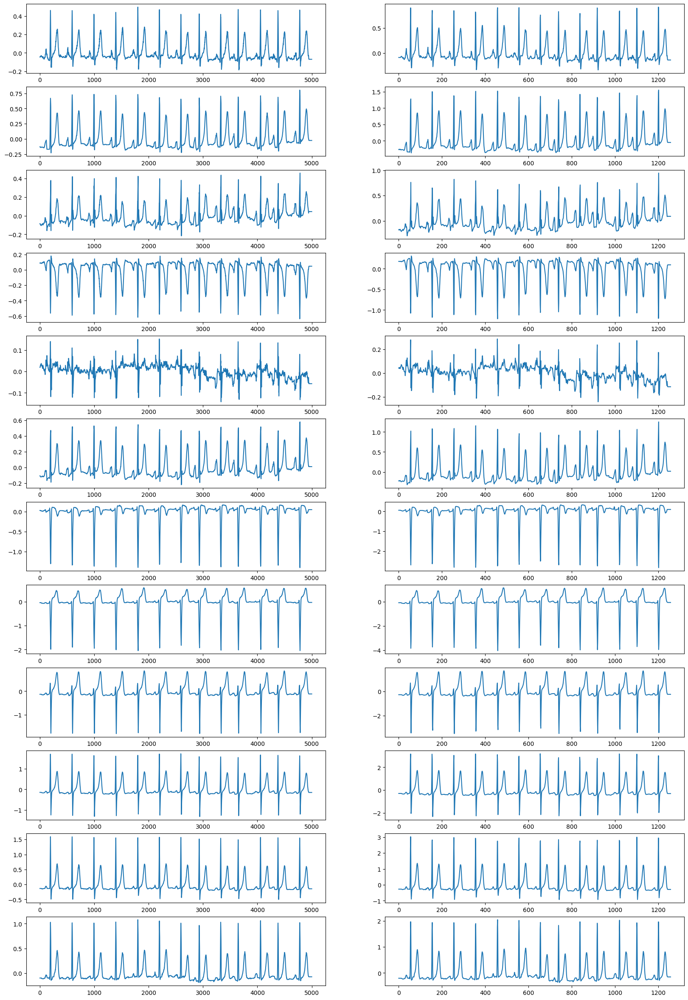

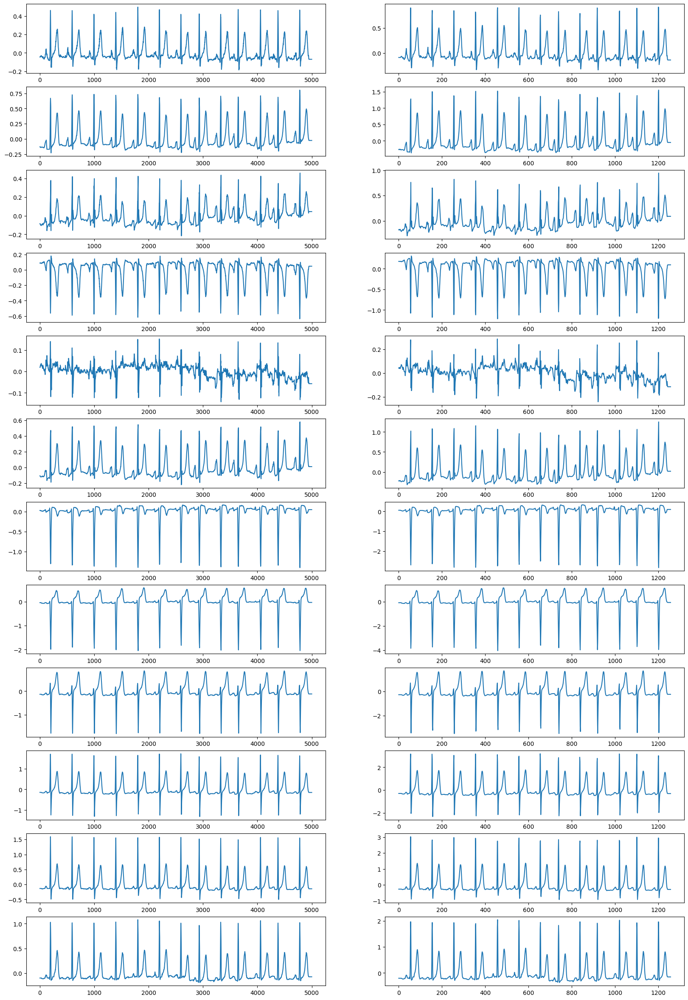

In [191]:
read_sample(df.sample(1, random_state=seed), decompose)

## Normalization

records500/11000/11554_hr
       NORM  MI  STTC  CD  HYP
11370     0   1     0   0    0
(12, 5000) (12, 5000)


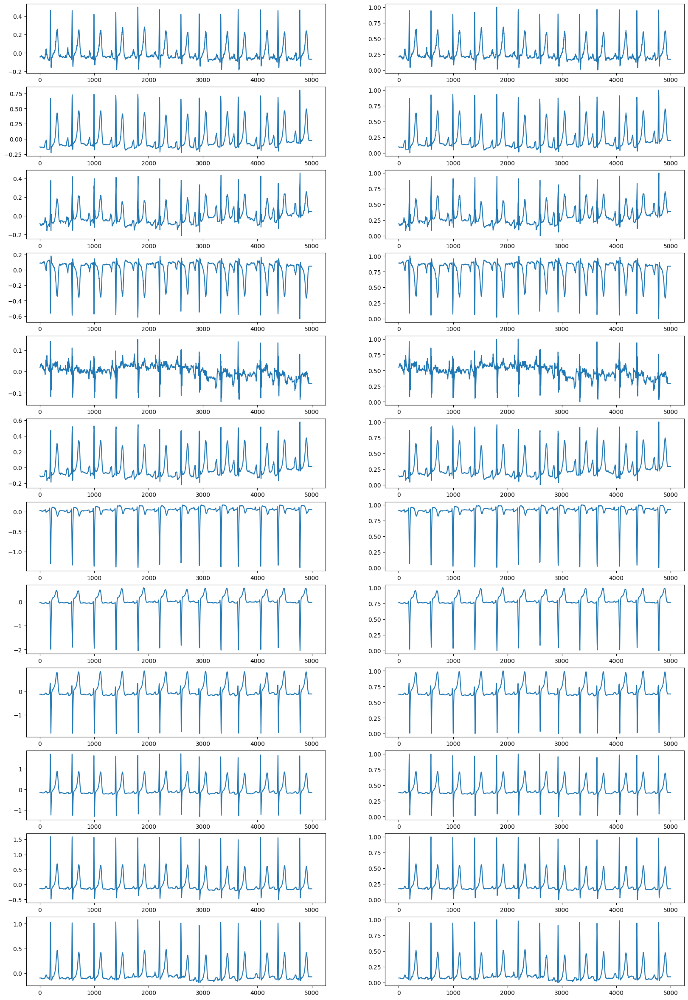

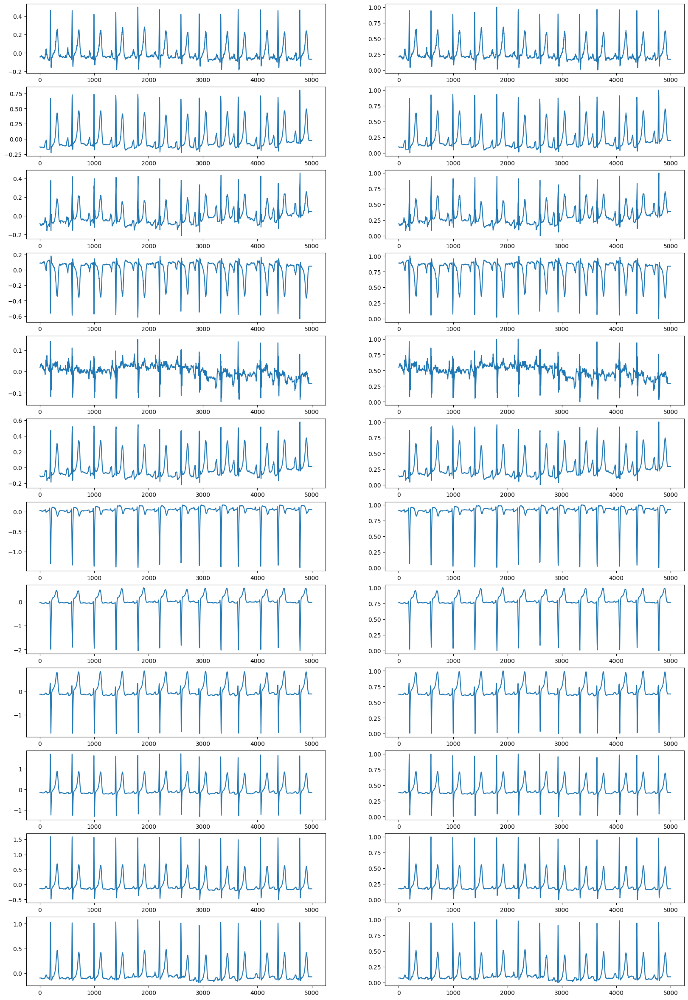

In [192]:
read_sample(df.sample(1, random_state=seed), minmax_norm)

## Both

### Normalization then DWT

records500/11000/11554_hr
       NORM  MI  STTC  CD  HYP
11370     0   1     0   0    0
(12, 5000) (12, 1258)


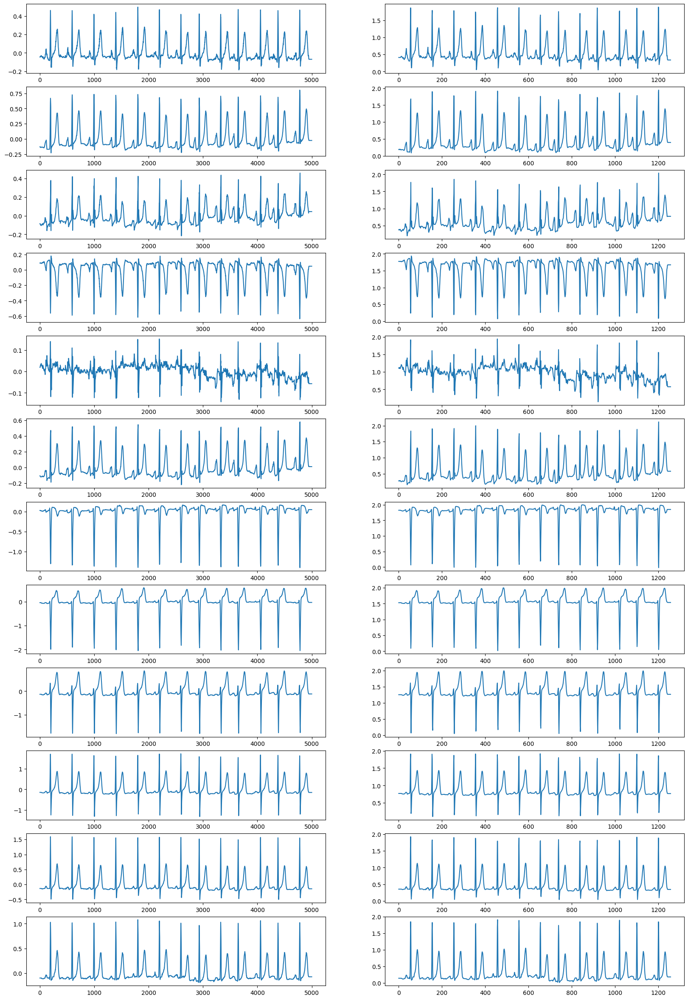

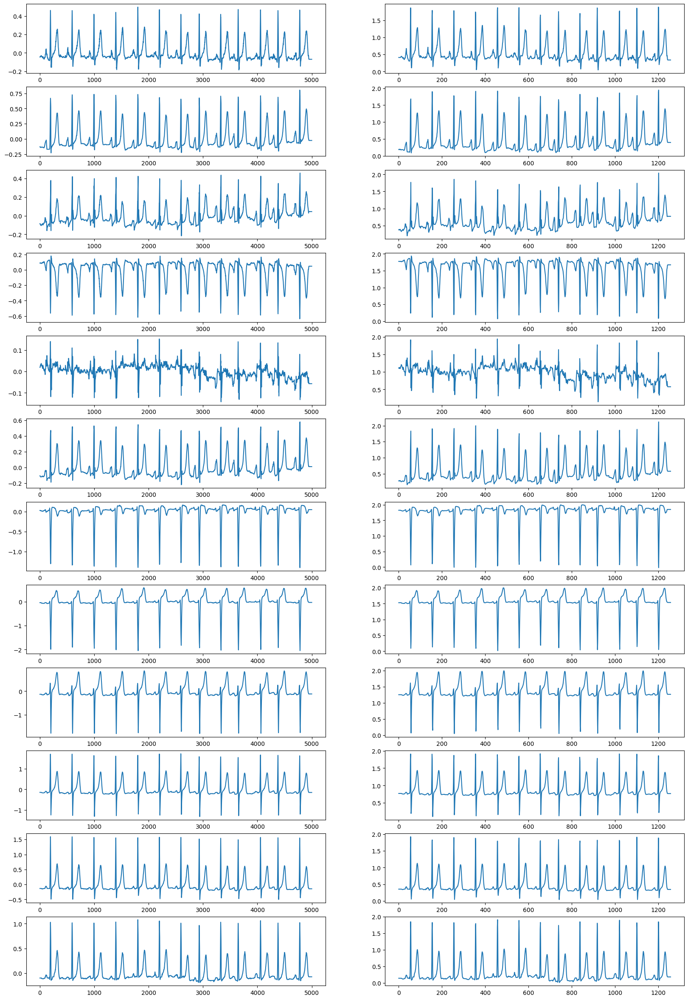

In [193]:
read_sample(df.sample(1, random_state=seed), transform_norm_dwt)

### DWT then normalization

records500/11000/11554_hr
       NORM  MI  STTC  CD  HYP
11370     0   1     0   0    0
(12, 5000) (12, 1258)
CPU times: total: 547 ms
Wall time: 551 ms


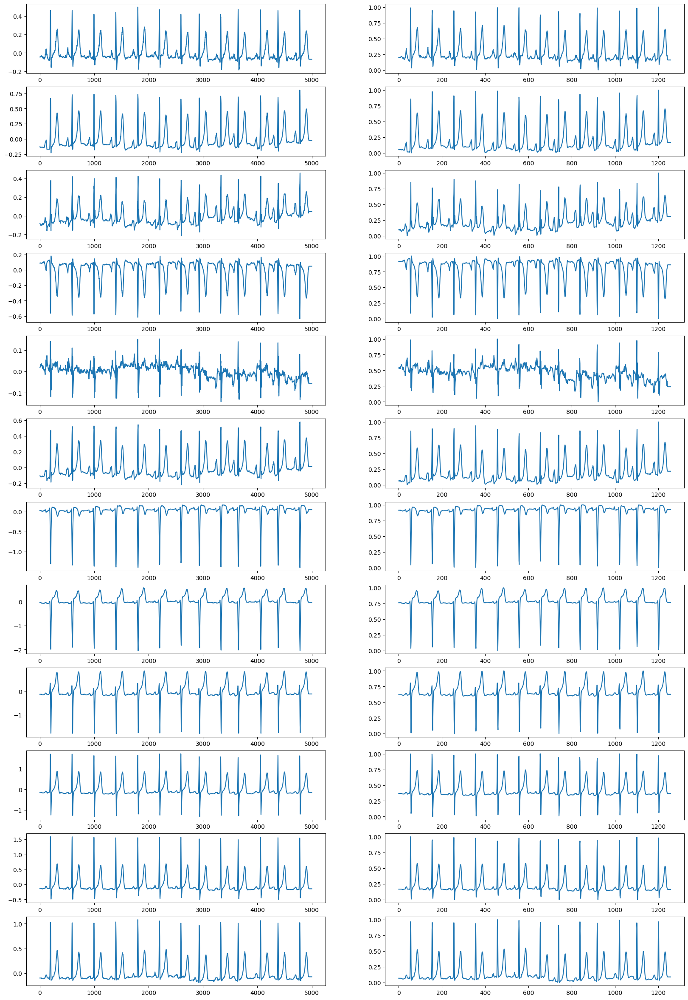

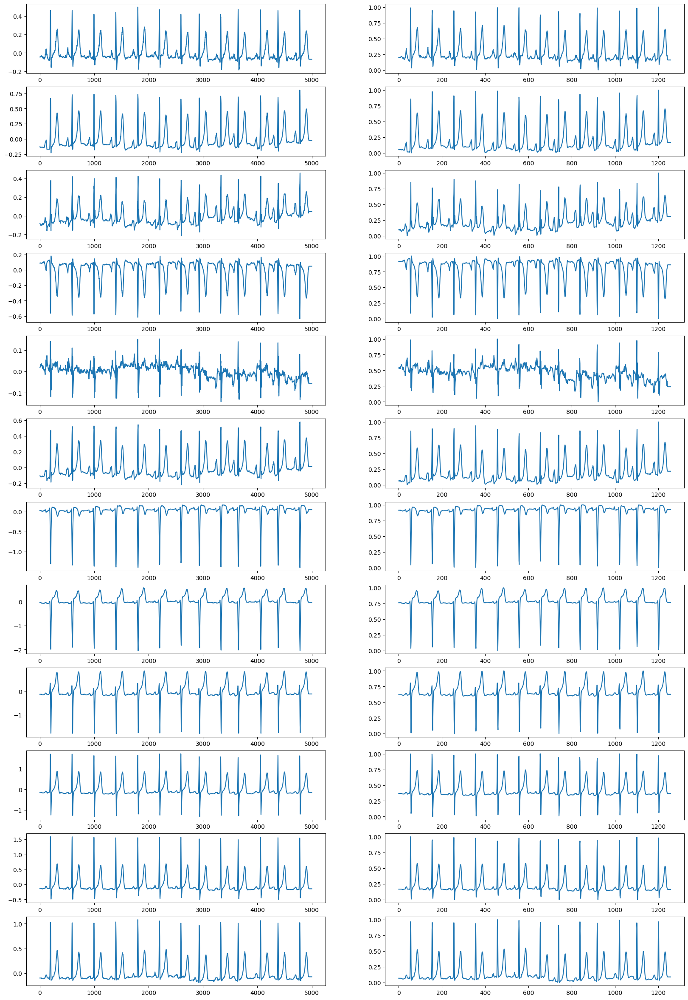

In [194]:
%%time
read_sample(df.sample(1, random_state=seed), transform_dwt_norm)

## Baseline Wander Removal

records500/11000/11554_hr
       NORM  MI  STTC  CD  HYP
11370     0   1     0   0    0
(12, 5000) (12, 5000)
CPU times: total: 547 ms
Wall time: 535 ms


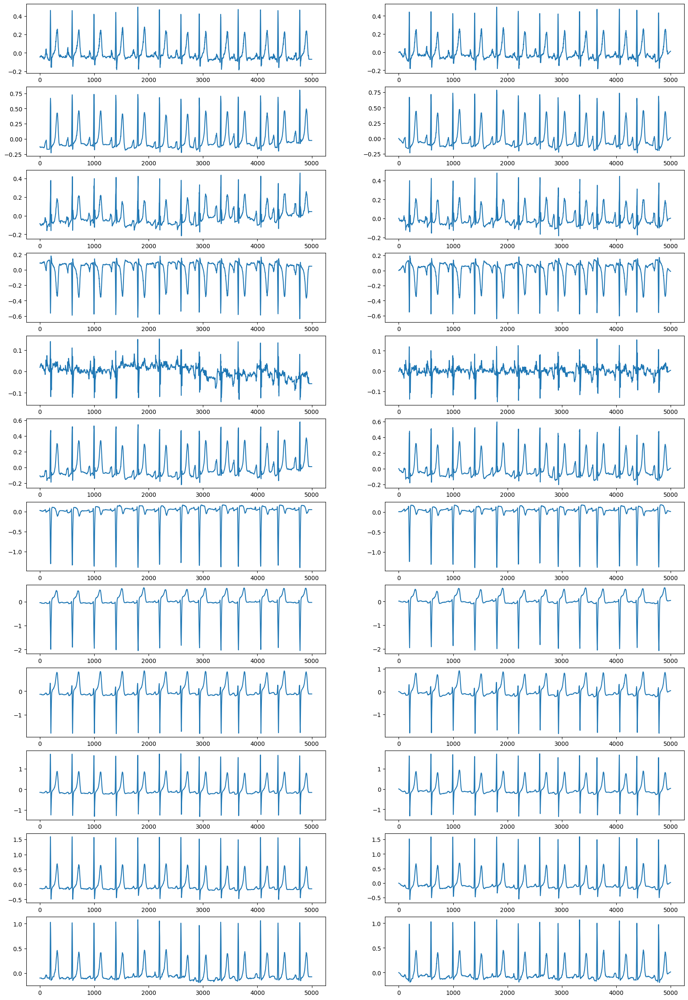

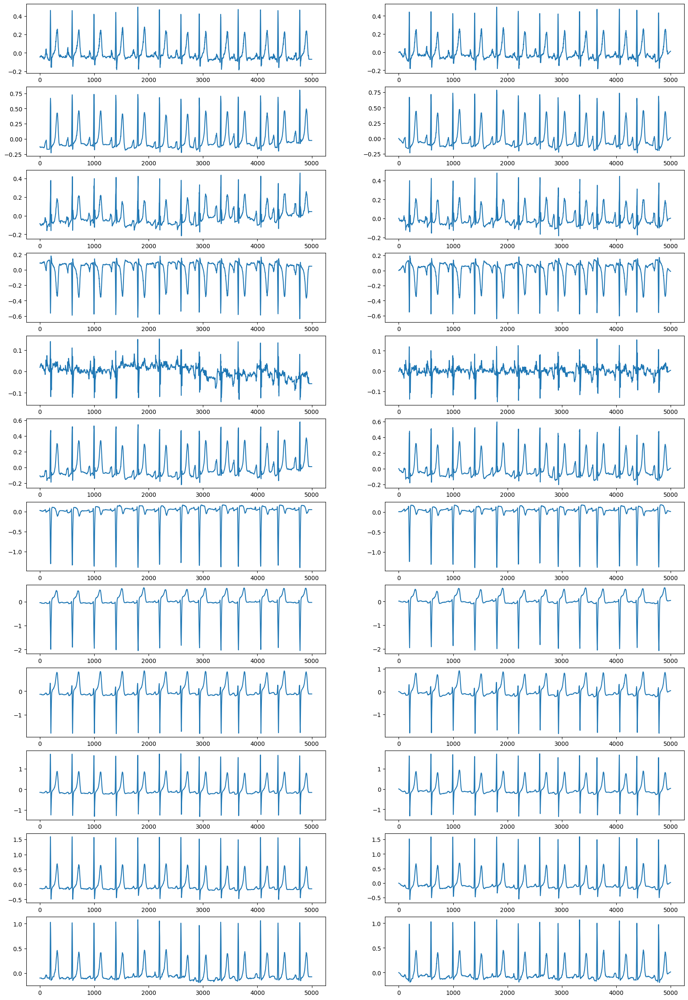

In [199]:
%%time
read_sample(df.sample(1, random_state=seed), remove_baseline_ecg)

# Combined

## `bwr_dwt_norm`

records500/04000/04520_hr
      NORM  MI  STTC  CD  HYP
4449     1   0     0   0    0
(12, 5000) (12, 1258)
CPU times: total: 516 ms
Wall time: 503 ms


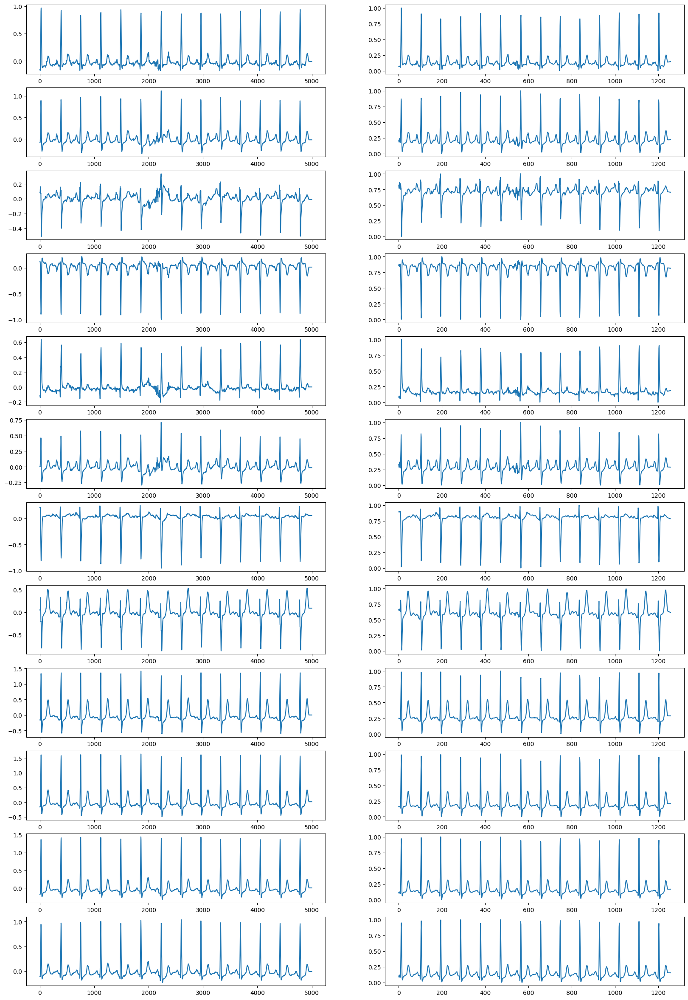

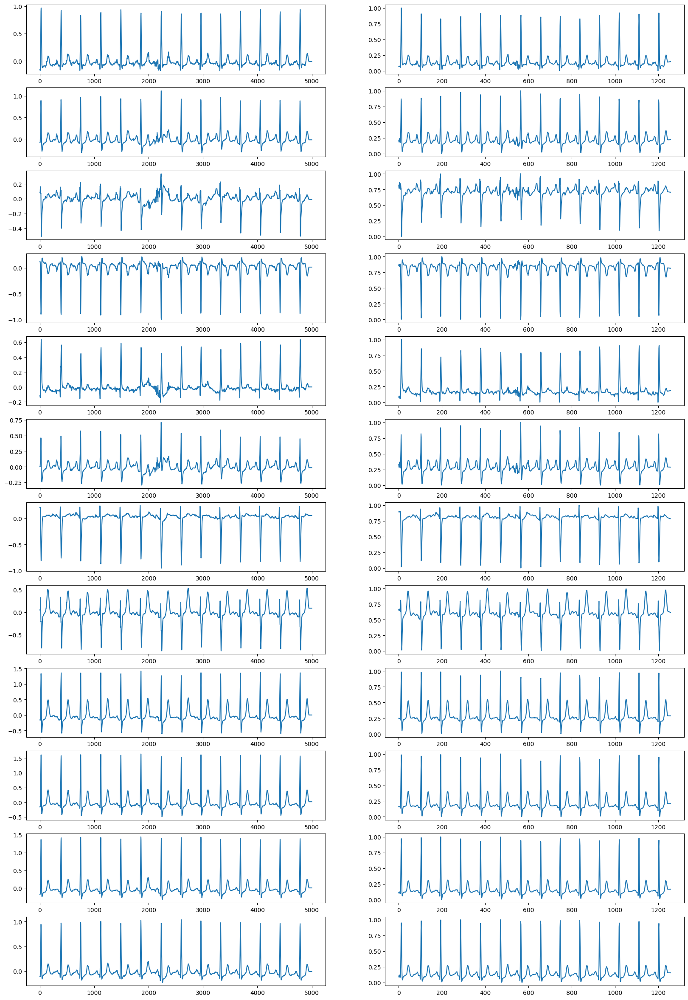

In [203]:
%%time
read_sample(df.sample(1, random_state=seed), bwr_dwt_norm)